In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
from robustnessgym import Dataset
import torch
from spr.data.celeb import build_celeb_df
from spr.train import train_celeb
import torchvision.transforms as transforms

[2021-04-07 09:59:19,877][INFO][root:41] :: Logging initialized.


ModuleNotFoundError: No module named 'spr.train'

In [4]:
from spr.data.celeb import build_celeb_df

valid_size = 5000
test_size = 5000
out = build_celeb_df(
    split_configs=[
        {"split": "train", "size": 202599 - test_size - valid_size}, 
        {"split": "valid", "size": valid_size},
        {"split": "test", "size": test_size}
    ])
df = out.load()


task: build_celeb_df, run_id=115


In [2]:
x = {"a": 1, "b": 2}
{"df": 1, **x}

{'df': 1, 'a': 1, 'b': 2}

In [59]:
df.columns

Index(['file', 'identity', '5_o_clock_shadow', 'arched_eyebrows', 'attractive',
       'bags_under_eyes', 'bald', 'bangs', 'big_lips', 'big_nose',
       'black_hair', 'blond_hair', 'blurry', 'brown_hair', 'bushy_eyebrows',
       'chubby', 'double_chin', 'eyeglasses', 'goatee', 'gray_hair',
       'heavy_makeup', 'high_cheekbones', 'male', 'mouth_slightly_open',
       'mustache', 'narrow_eyes', 'no_beard', 'oval_face', 'pale_skin',
       'pointy_nose', 'receding_hairline', 'rosy_cheeks', 'sideburns',
       'smiling', 'straight_hair', 'wavy_hair', 'wearing_earrings',
       'wearing_hat', 'wearing_lipstick', 'wearing_necklace',
       'wearing_necktie', 'young', 'img_path', 'example_hash', 'split'],
      dtype='object')

In [9]:
from spr.data.celeb import build_celeb_df

df = build_celeb_df.out(29).load()

In [10]:
dataset = Dataset.load_image_dataset(
        df[df.split == "valid"].to_dict("records"),    
        img_keys="img_path"
)

[2021-04-05 20:35:41,119][INFO][robustnessgym.core.dataformats.vision:178] :: Created `VisionDataset` with 4949 rows and 45 columns.
[2021-04-05 20:35:41,123][INFO][root:237] :: Added column `index` with length `4949`.


In [49]:
train_celeb.get_artifacts("best_chkpt", run_id=33)

{'current_epoch': 2,
 'global_step': 25278,
 'model': <terra.io.Artifact at 0x7fdb7591fa90>,
 'valid': {'preds': <terra.io.Artifact at 0x7fdb7591ffd0>,
  'targets': <terra.io.Artifact at 0x7fdb7591fc70>,
  'sample_ids': <terra.io.Artifact at 0x7fdb7591fd60>}}

In [14]:

from spr.vision import score
from spr.data.celeb import celeb_task_config
model = train.get_artifacts("best_chkpt", run_id=201)["model"]
out = score(
    data_df=build_celeb_df.out(29), 
    model=model,
    target_key="arched_eyebrows", 
    **celeb_task_config
)

task: score, run_id=202
/dfs/scratch0/sabri/miniconda3/envs/rg/lib/python3.8/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `AUROC` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
Global seed set to 123
[2021-04-07 10:10:03,945][INFO][lightning:54] :: Global seed set to 123
[2021-04-07 10:10:04,212][INFO][robustnessgym.core.dataformats.vision:178] :: Created `VisionDataset` with 4949 rows and 45 columns.
[2021-04-07 10:10:04,217][INFO][root:237] :: Added column `index` with length `4949`.
GPU available: True, used: True
[2021-04-07 10:10:04,220][INFO][lightning:55] :: GPU available: True, used: True
TPU available: None, using: 0 TPU cores
[2021-04-07 10:10:04,221][INFO][lightning:55] :: TPU available: None, using: 0 TPU cores
[2021-04-07 10:10:04,227][INFO][pytorch_lightning.accelerators.gpu:51] :: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'valid_accuracy': 0.8533036708831787,
 'valid_auroc': 0.910697340965271,
 'valid_loss': 0.3197457492351532}
--------------------------------------------------------------------------------


In [ ]:
from spr.vision import fit_bss
from spr.data.celeb import celeb_task_config

model = train.get_artifacts("best_chkpt", run_id=201)["model"]
out = fit_bss(
    data_df=build_celeb_df.out(29), 
    model=model,
    target_key="arched_eyebrows",
    config={
        "target_module": "model.layer4",
        "activation_dim": 512,
        "num_components": 4,
        "pred_loss_weight": 100,
        "cov_loss_weight": 1e-06,
        "lr": 1e-1,
        "mixing_dropout_prob": 0.0,
        "cond_on_target": True
    }, 
    batch_size=4,
    **celeb_task_config
)

In [118]:
from spr.bss import SourceSeparator
from spr.vision import train
model = train.get_artifacts("best_chkpt", run_id=201)["model"].load()
separator = SourceSeparator(
    model, 
    target_module=model.model.layer4,
    config={
        "activation_dim": 512,
        "num_components": 4,
        "pred_loss_weight": 100,
        "cov_loss_weight": 1e-06,
        "lr": 1e-1,
        "mixing_dropout_prob": 0.0,
        "cond_on_target": True
    }
)

/dfs/scratch0/sabri/miniconda3/envs/rg/lib/python3.8/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `AUROC` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


In [10]:
from spr.utils import nested_getattr
from spr.vision import train

model = train.get_artifacts("best_chkpt", run_id=201)["model"].load()
out = nested_getattr(model, "model.layer45")
out

ModuleAttributeError: 'ResNet' object has no attribute 'layer45'

In [119]:
from spr.data.celeb import celeb_transform

out = separator.fit(
    dataloader=dataset.to_dataloader(
        keys=["img_path", "wearing_earrings"],
        key_to_transform={"img_path": celeb_transform},
        batch_size=4,
    ),
    num_epochs=20
)

In [120]:
from spr.data.celeb import celeb_transform

components, outs, targets = separator.compute(dataloader=dataset.to_dataloader(
    keys=["img_path", "wearing_earrings"],
    key_to_transform={"img_path": celeb_transform},
    batch_size=4
))

In [121]:
separator.component_classifier.weights

Parameter containing:
tensor([[ 0.0978, -0.0719, -1.2761, -0.0196, -9.5873],
        [-0.3002, -0.0555,  0.9222,  0.0441, 10.2477]], device='cuda:0',
       requires_grad=True)

task: visualize_component, run_id=198
[2021-04-06 16:00:57,794][INFO][robustnessgym.core.dataformats.vision:178] :: Created `VisionDataset` with 4949 rows and 45 columns.
[2021-04-06 16:00:57,799][INFO][root:237] :: Added column `index` with length `4949`.


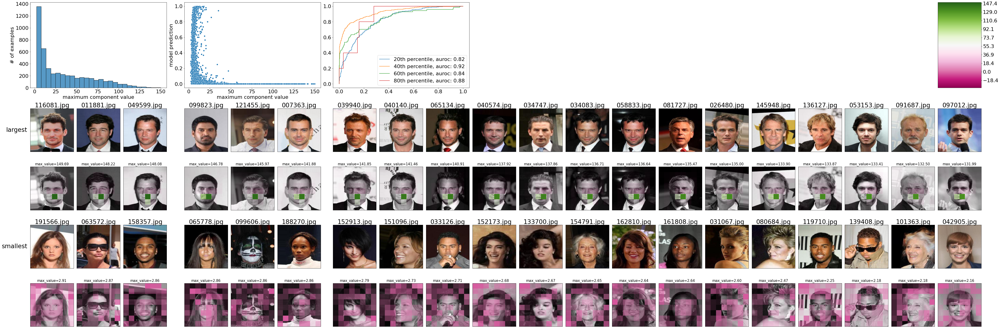

In [126]:
from spr.vis import visualize_component
visualize_component(
    data_df=build_celeb_df.out(29).load(),
    components=components,
    comp_idx=0,
    preds=torch.softmax(outs, dim=-1)[:, -1],
    targets=targets,
    num_examples=20,
    flip=False
);

In [48]:
np.linspace(0, 100, num=6)

array([  0.,  20.,  40.,  60.,  80., 100.])

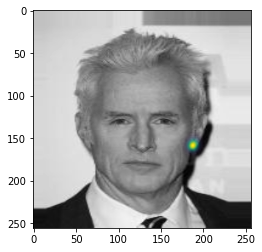

In [74]:
from spr.vis import get_saliency
model = train_celeb.get_artifacts("best_chkpt", run_id=53)["model"].load()
for idx, x in enumerate(dataset.to_dataloader(
    keys=["img_path"],
    key_to_transform={"img_path": celeb_transform},
    batch_size=1,
)):
    if idx == 10:
        break
grad = get_saliency(model=model, inp=x.squeeze(0), device=0, show=True, threshold=0.5)